In [1]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
# Figures parameters
sns.set()
plt.style.use('seaborn-whitegrid')
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')

In [3]:
mydata = pd.read_csv('mydata_with_category.csv', low_memory=False)
print(f'mydata: {mydata.shape}')

mydata: (83952, 14)


In [4]:
for i in mydata.columns:
    print(i)

customer_id
number_of_items
payment_installments
payment_value
review_score
product_volume_m3
product_weight_kg
days_purchase_to_delivery
lag_real_estimated_delivery
client_novelty_scale
order_frequency
distance_from_seller
payment_type
product_category


In [5]:
print(mydata['payment_type'].unique())

# Transform into binary variables
data_payment_type = pd.get_dummies(mydata.payment_type, prefix='payment_type')

# Merge both tables and drop the object featur
mydata = mydata.join(data_payment_type)
mydata.drop(['payment_type'], axis=1, inplace=True)

# Verify if the sum of payment_type columns is 1
df = mydata.iloc[:,-4:]
df['sum'] = df.sum(axis=1)
print('The unique values of the column sum:',df['sum'].unique())

['credit_card' 'boleto' 'voucher' 'debit_card']
The unique values of the column sum: [1]


In [6]:
print(mydata['product_category'].unique())

# Transform into binary variables
data_product_category = pd.get_dummies(mydata.product_category, prefix='product_category')

# Merge both tables and drop the object feature
mydata = mydata.join(data_product_category)
mydata.drop(['product_category'], axis=1, inplace=True)

# Verify if the sum of product_category columns is 1
df = mydata.iloc[:,-5:]
df['sum'] = df.sum(axis=1)
print('Les valeurs unique de la colonne sum:',df['sum'].unique())

['house_and_decoration' 'beauty_fashion' 'other' 'technology_appliances'
 'food_product']
Les valeurs unique de la colonne sum: [1]


In [7]:
mydata.head(10)

,customer_id,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,product_weight_kg,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,...,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances
0,0000366f3b9a7992bf8c76cfdf3221e2,1.0,8.0,141.90,5.0,0.007616,1.500,7.0,4.0,584.0,...,110.57,0,1,0,0,0,0,1,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1.0,1.0,27.19,4.0,0.005148,0.375,4.0,4.0,581.0,...,22.17,0,1,0,0,1,0,0,0,0
2,0000f46a3911fa3c0805444483337064,1.0,8.0,86.22,3.0,0.043750,1.500,25.0,2.0,159.0,...,516.94,0,1,0,0,0,0,0,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,1.0,4.0,43.62,4.0,0.001045,0.150,20.0,11.0,375.0,...,2481.29,0,1,0,0,0,0,0,0,1
4,0004aac84e0df4da2b147fca70cf8255,1.0,6.0,196.89,5.0,0.000528,6.050,13.0,7.0,408.0,...,154.51,0,1,0,0,0,0,0,0,1
5,0004bd2a26a76fe21f786e4fbd80607f,1.0,8.0,166.98,4.0,0.008241,3.000,1.0,12.0,550.0,...,27.19,0,1,0,0,0,0,1,0,0
6,00050ab1314c0e55a6ca13cf7181fecf,1.0,1.0,35.38,4.0,0.000816,0.300,7.0,12.0,564.0,...,101.55,1,0,0,0,0,0,0,0,1
7,0005e1862207bf6ccc02e4228effd9a0,1.0,3.0,150.12,4.0,0.006600,2.250,4.0,28.0,153.0,...,246.72,0,1,0,0,1,0,0,0,0
8,0005ef4cd20d2893f0d9fbd94d3c0d97,1.0,4.0,129.76,1.0,0.015834,1.136,54.0,-31.0,525.0,...,2250.64,0,1,0,0,0,0,0,1,0
9,0006fdc98a402fceb4eb0ee528f6a8d4,1.0,2.0,29.00,3.0,0.004800,0.200,17.0,11.0,288.0,...,776.76,0,1,0,0,0,0,1,0,0


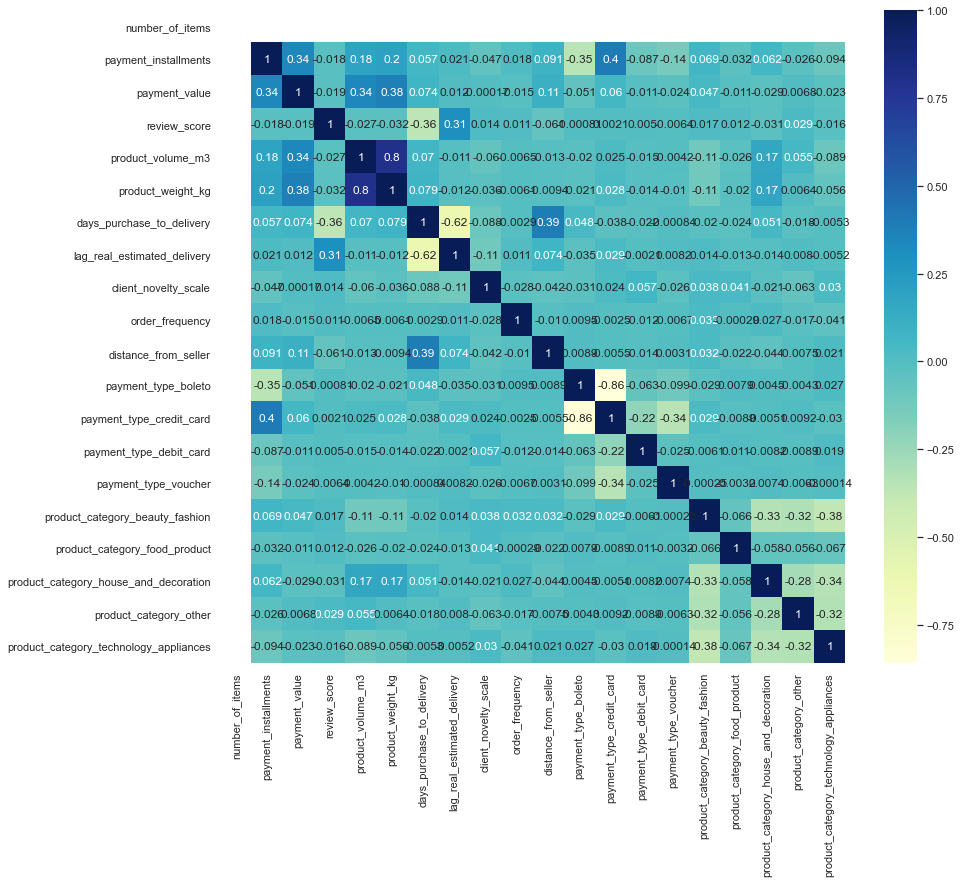

In [8]:
# Check the correlations between features
plt.figure(figsize=(14,12))
sns.heatmap(mydata.corr(),annot=True, cmap='YlGnBu')
plt.show()

In [9]:
# The heatmap shows that product weight is correlated with its volume.
# Product weight will be droped.
mydata.drop(['product_weight_kg'], axis=1, inplace=True)
mydata.shape

(83952, 20)

# PCA  

In [10]:
mydata.drop(['customer_id'], axis=1, inplace=True)
mydata.shape
# I ended up with 19 indicators and 83952 rows

(83952, 19)

In [11]:
# Transform the data into array numpy
X = mydata.values
X.shape

(83952, 19)

In [12]:
# We will start by standardizing the data
from sklearn import preprocessing

std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [13]:
# Now let's calculate the first two principal components:
from sklearn import decomposition # decomposition me permet de faire un PCA

pca = decomposition.PCA(n_components=2) 
pca.fit(X_scaled)# fit pca on X

PCA(n_components=2)

In [14]:
# pca.explained_variance_ratio_ gives us the percentage of variance explained by each component
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum()) # The first two principal companents explains 24% of the variation 

[0.12564203 0.10985968]
[0.12564203 0.23550171]


(-1.0, 1.0)

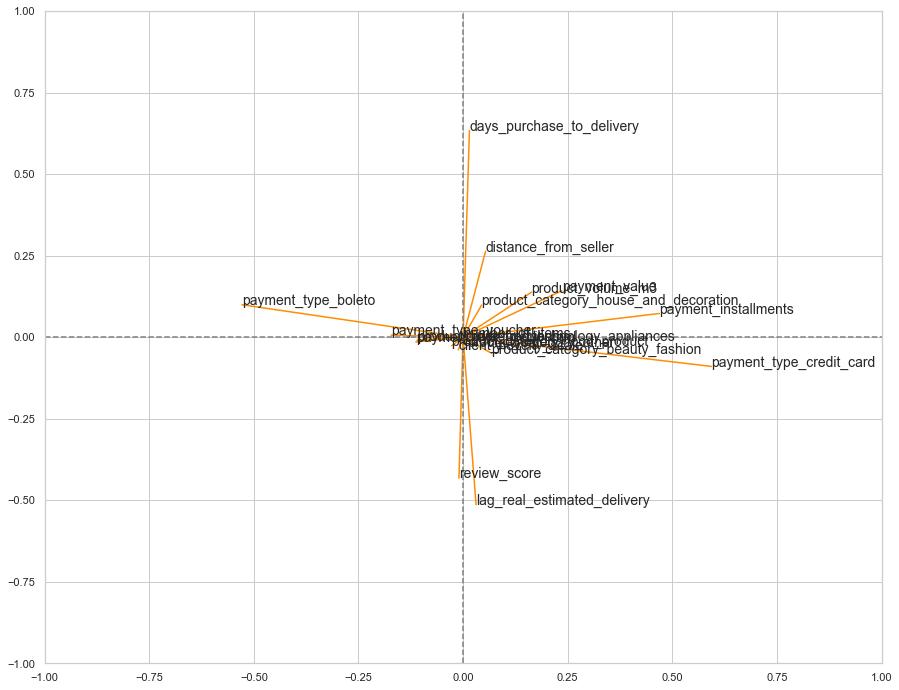

In [15]:
# Contribution of each variable to the principal components
#=============================================================

# To better understand what these principal components capture, we can use pca.components_, 
# which gives us the coordinates of the principal components in the initial space (the one with 19 features).
fig = plt.figure(figsize=(15,12))

pcs = pca.components_

for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
    # Afficher un segment de l'origine au point (x, y)
    plt.plot([0, x], [0, y], color='darkorange')
    # Afficher le nom (data.columns[i]) de la performance
    plt.text(x, y, mydata.columns[i], fontsize='14')

# Afficher une ligne horizontale y=0
plt.plot([-1, 1], [0, 0], color='grey', ls='--')

# Afficher une ligne verticale x=0
plt.plot([0, 0], [-1, 1], color='grey', ls='--')

plt.xlim([-1, 1])
plt.ylim([-1, 1])

# pca interpretation: 
# pca component 1: the first component is mostly explained by the type of payment and the price
# pca component 2: it seems that the client who have the bigest lag between purchase and delivery are farest and the least happy

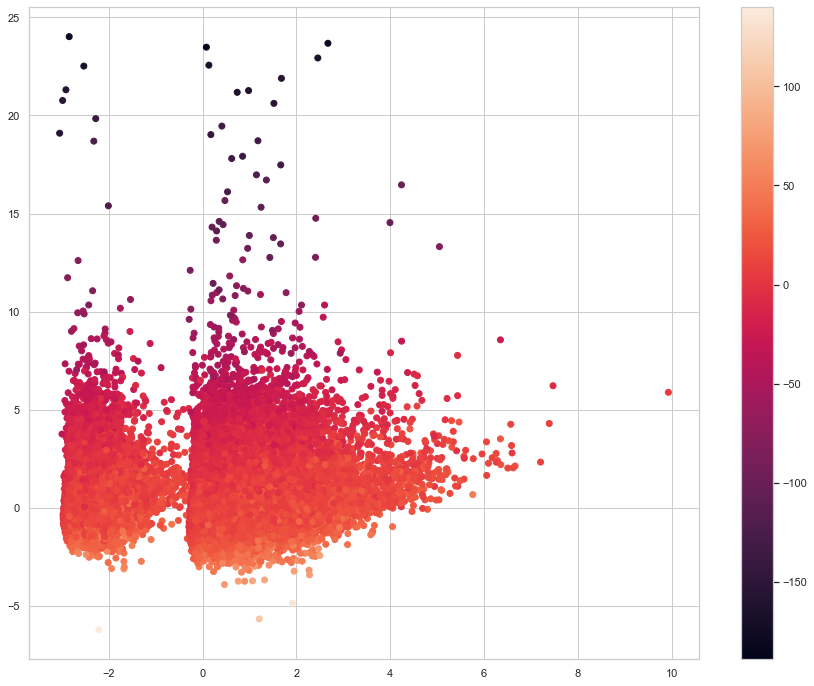

In [16]:
from matplotlib import pyplot as plt

fig = plt.figure(figsize=(15,12))

# project X on the principal components
X_projected = pca.transform(X_scaled)

# display each observation
plt.scatter(X_projected[:, 0], X_projected[:, 1],
    # color by using the 'lag_real_estimated_delivery' variable
    c=mydata.get('lag_real_estimated_delivery'))

plt.colorbar() # add the color bar

# KMeans

# KMeans segmentation without the variables of 'product_category'

In [17]:
mydata1 = mydata.iloc[:,:-5]
mydata1

,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
0,1.0,8.0,141.90,5.0,0.007616,7.0,4.0,584.0,1.0,110.57,0,1,0,0
1,1.0,1.0,27.19,4.0,0.005148,4.0,4.0,581.0,1.0,22.17,0,1,0,0
2,1.0,8.0,86.22,3.0,0.043750,25.0,2.0,159.0,1.0,516.94,0,1,0,0
3,1.0,4.0,43.62,4.0,0.001045,20.0,11.0,375.0,1.0,2481.29,0,1,0,0
4,1.0,6.0,196.89,5.0,0.000528,13.0,7.0,408.0,1.0,154.51,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83947,1.0,2.0,167.32,5.0,0.000704,19.0,13.0,451.0,1.0,2368.23,0,1,0,0
83948,1.0,1.0,84.58,4.0,0.032076,30.0,2.0,434.0,1.0,1527.20,0,1,0,0
83949,1.0,1.0,112.46,5.0,0.003315,15.0,30.0,127.0,1.0,1526.12,0,1,0,0
83950,1.0,5.0,133.69,5.0,0.004480,12.0,14.0,576.0,1.0,637.86,0,1,0,0


In [18]:
# Transform the data into array numpy
X = mydata1.values
X.shape

# Standardize the data so that they all have the same importance
from sklearn import preprocessing
X_norm = preprocessing.scale(X)
print(X_norm.shape)

(83952, 14)


In [26]:
# pip install yellowbrick

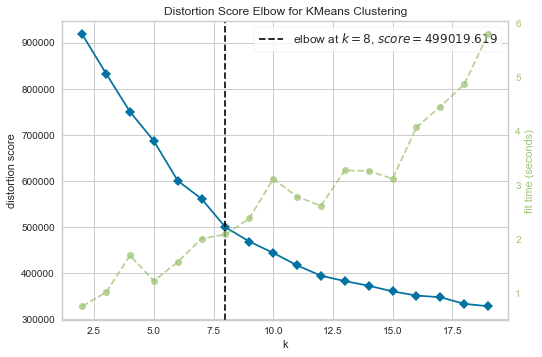

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [25]:
# Elbow Method for K means
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), timings= True)
visualizer.fit(X_norm)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

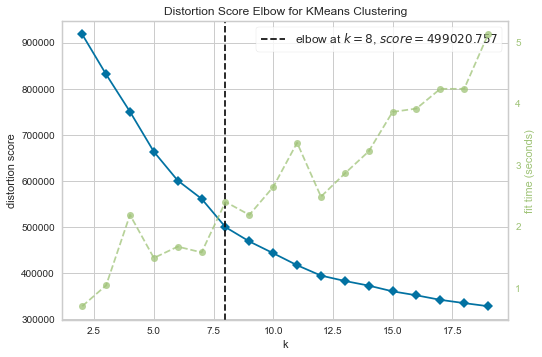

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [27]:
# Elbow Method for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(init='k-means++')
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), timings= True)
visualizer.fit(X_norm)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

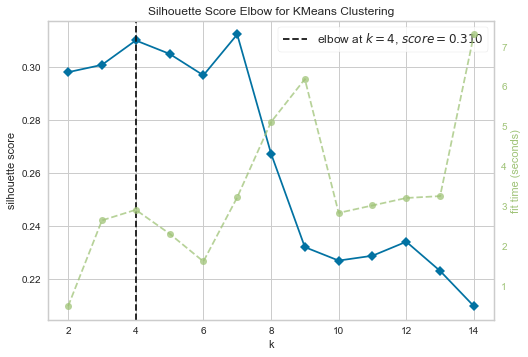

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [28]:
# Silhouette Score for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette', timings= True)
visualizer.fit(X_norm)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

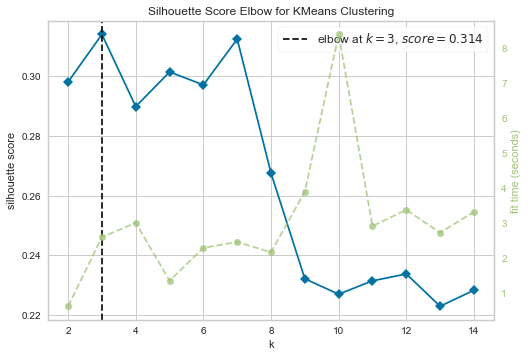

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [29]:
# Silhouette Score for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(init='k-means++')

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette', timings= True)
visualizer.fit(X_norm)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

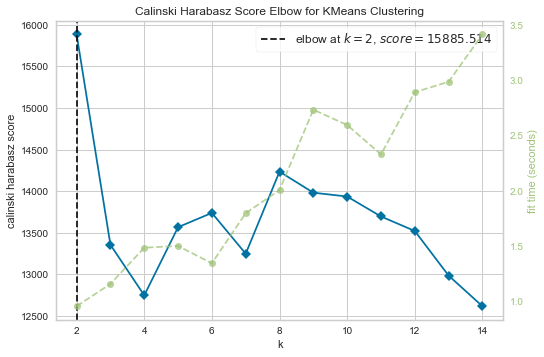

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [30]:
# Calinski Harabasz Score for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(init='k-means++')
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15),metric='calinski_harabasz', timings= True)
visualizer.fit(X_norm)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

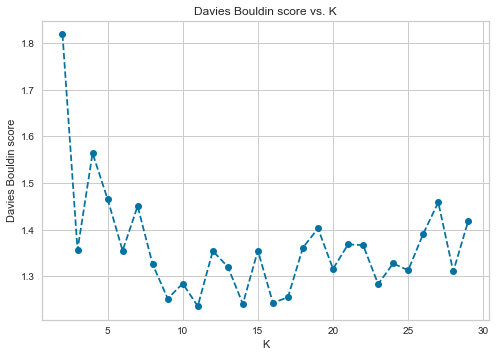

In [31]:
# Davies Bouldin score for K means
from sklearn.metrics import davies_bouldin_score
def get_kmeans_score(data, center):
    '''
    returns the kmeans score regarding Davies Bouldin for points to centers
    INPUT:
        data - the dataset you want to fit kmeans to
        center - the number of centers you want (the k value)
    OUTPUT:
        score - the Davies Bouldin score for the kmeans model fit to the data
    '''
    #instantiate kmeans
    kmeans = KMeans(n_clusters=center, init='k-means++')
# Then fit the model to your data using the fit method
    model = kmeans.fit_predict(X_norm)
    
    # Calculate Davies Bouldin score
    score = davies_bouldin_score(X_norm, model)
    
    return score
scores = []
centers = list(range(2,30))
for center in centers:
    scores.append(get_kmeans_score(X_norm, center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

In [ ]:
# According to the curves above I chose to run the analysis with 8 clusters

In [19]:
# To see what the clusters look like we will use a PCA to project the data on 2 dimensions
pca = decomposition.PCA(n_components=2)
pca.fit(X_norm)
print(pca.explained_variance_ratio_.cumsum())
X_trans = pca.transform(X_norm)

[0.17259688 0.32403759]


In [21]:
from sklearn.cluster import KMeans

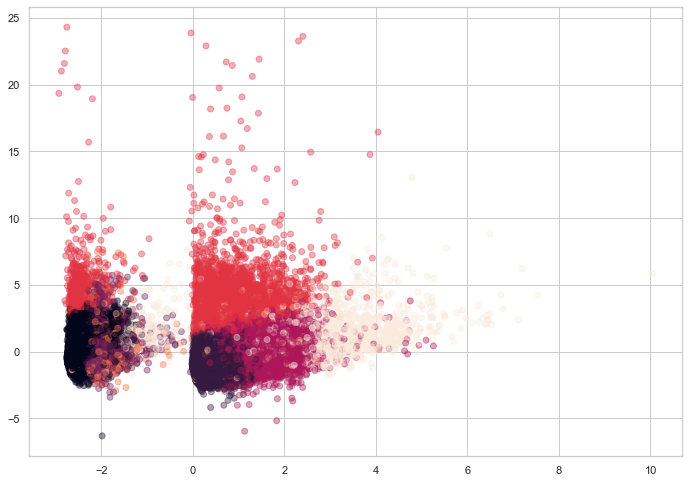

In [22]:
# I will display the data in these two components and colored according to the cluster for which they belong

# Figure parameters
sns.set()
plt.style.use('seaborn-whitegrid')
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')

cls = KMeans(n_clusters=8)# KMeans for 8 clusters
cls.fit(X_norm)
plt.scatter(X_trans[:, 0], X_trans[:, 1], c=cls.labels_, alpha=0.4)
# We can note that the segregation works well. We can see well defined groups

In [23]:
# Add the different clusters to the data
columns_  = mydata1.columns

data_results = pd.DataFrame(X_norm, columns=columns_)
data_results['group'] = cls.labels_+1

data_results

,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,group
0,0.0,1.980877,-0.043070,0.646352,-0.325377,-0.597221,-0.701873,0.834552,-0.149468,-0.828691,-0.499043,0.581642,-0.125854,-0.198224,4
1,0.0,-0.695181,-0.603410,-0.160359,-0.431244,-0.909192,-0.701873,0.814879,-0.149468,-0.976681,-0.499043,0.581642,-0.125854,-0.198224,2
2,0.0,1.980877,-0.315058,-0.967070,1.224614,1.274603,-0.898377,-1.952520,-0.149468,-0.148390,-0.499043,0.581642,-0.125854,-0.198224,4
3,0.0,0.451701,-0.523152,-0.160359,-0.607245,0.754652,-0.014108,-0.536032,-0.149468,3.140114,-0.499043,0.581642,-0.125854,-0.198224,4
4,0.0,1.216289,0.225547,0.646352,-0.629422,0.026720,-0.407116,-0.319624,-0.149468,-0.755131,-0.499043,0.581642,-0.125854,-0.198224,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83947,0.0,-0.312887,0.081103,0.646352,-0.621872,0.650662,0.182397,-0.037637,-0.149468,2.950841,-0.499043,0.581642,-0.125854,-0.198224,4
83948,0.0,-0.695181,-0.323069,-0.160359,0.723850,1.794554,-0.898377,-0.149120,-0.149468,1.542879,-0.499043,0.581642,-0.125854,-0.198224,5
83949,0.0,-0.695181,-0.186879,0.646352,-0.509872,0.234701,1.852683,-2.162370,-0.149468,1.541071,-0.499043,0.581642,-0.125854,-0.198224,4
83950,0.0,0.833995,-0.083174,0.646352,-0.459898,-0.077270,0.280649,0.782090,-0.149468,0.054042,-0.499043,0.581642,-0.125854,-0.198224,4


In [24]:
# Group the clusters by the means of each feature
results = data_results.groupby('group').mean()
results = results.rename_axis('index').reset_index().rename(columns = {'index': 'Clusters'})
results.drop(['number_of_items'], axis=1, inplace=True)
results

,Clusters,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
0,1,-0.695181,-0.168721,0.090672,-0.105824,-0.031371,0.040190,-0.057762,-0.149468,-0.001909,2.003835,-1.719272,-0.125854,-0.198224
1,2,-0.288296,-0.237065,0.164968,-0.168506,-0.340052,0.108089,0.115113,-0.149468,-0.370557,-0.499043,0.581642,-0.125854,-0.198224
2,3,-0.695181,-0.154468,-0.015677,-0.049998,-0.047948,0.077171,-0.129898,-0.062151,0.008496,-0.499043,-1.719272,-0.125854,5.044790
3,4,1.284552,0.254913,0.127784,0.023334,0.103328,0.313718,-0.200841,-0.149468,0.723349,-0.499043,0.581642,-0.125854,-0.198224
4,5,0.083843,0.003980,-2.047117,-0.013193,2.509588,-2.175184,0.048977,-0.143989,0.515342,-0.156484,0.256643,-0.125854,-0.175253
5,6,-0.695181,-0.114857,0.039775,-0.137918,-0.170551,-0.015876,0.453754,-0.093163,-0.110067,-0.499043,-1.719272,7.945719,-0.198224
6,7,0.151972,-0.103154,0.056947,-0.044545,-0.021691,0.074336,-0.173153,5.649818,-0.065055,0.078268,0.041026,-0.125854,-0.175690
7,8,1.270902,3.406896,-0.055949,3.344631,0.105930,0.058872,-0.127828,-0.136642,0.095806,-0.255580,0.340032,-0.115999,-0.164082


In [25]:
# Rename the feature for a better representation of the results
results = results.rename(columns = {'payment_installments': 'Installments',
                                    'payment_value': 'Price',
                                    'review_score': 'Review',
                                    'product_volume_m3': 'Volume(m3)',
                                    'days_purchase_to_delivery': 'Days to delivery',
                                    'lag_real_estimated_delivery': 'Lag delivery', 
                                    'client_novelty_scale': 'New customer', 
                                    'order_frequency': 'Frequency', 
                                    'distance_from_seller': 'Seller distance',
                                    'payment_type_boleto': 'Boleto',
                                    'payment_type_credit_card': 'Credit card',
                                    'payment_type_debit_card': 'Debit card',
                                    'payment_type_voucher': 'Voucher'}, inplace = False)

In [26]:
import plotly.graph_objects as go

categories = results.iloc[:,1:].columns

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==1].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='First'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==2].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Second'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==3].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Third'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==4].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fourth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==5].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fifth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==6].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Sixth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==7].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Seventh'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==8].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eighth'
))


fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=False,
        range=[-3, 8.5]
    )),
  showlegend=True,
  autosize=True,
    width=750,
    height=750
)


# KMeans segmentation with all the variables

In [17]:
mydata2 = mydata.iloc[:,:]
mydata2

,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances
0,1.0,8.0,141.90,5.0,0.007616,7.0,4.0,584.0,1.0,110.57,0,1,0,0,0,0,1,0,0
1,1.0,1.0,27.19,4.0,0.005148,4.0,4.0,581.0,1.0,22.17,0,1,0,0,1,0,0,0,0
2,1.0,8.0,86.22,3.0,0.043750,25.0,2.0,159.0,1.0,516.94,0,1,0,0,0,0,0,1,0
3,1.0,4.0,43.62,4.0,0.001045,20.0,11.0,375.0,1.0,2481.29,0,1,0,0,0,0,0,0,1
4,1.0,6.0,196.89,5.0,0.000528,13.0,7.0,408.0,1.0,154.51,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83947,1.0,2.0,167.32,5.0,0.000704,19.0,13.0,451.0,1.0,2368.23,0,1,0,0,0,0,0,1,0
83948,1.0,1.0,84.58,4.0,0.032076,30.0,2.0,434.0,1.0,1527.20,0,1,0,0,1,0,0,0,0
83949,1.0,1.0,112.46,5.0,0.003315,15.0,30.0,127.0,1.0,1526.12,0,1,0,0,0,0,0,0,1
83950,1.0,5.0,133.69,5.0,0.004480,12.0,14.0,576.0,1.0,637.86,0,1,0,0,1,0,0,0,0


In [18]:
# Transform the data into array numpy
X = mydata2.values
X.shape

# Standardize the data so that they all have the same importance
from sklearn import preprocessing
X_norm = preprocessing.scale(X)
print(X_norm.shape)

(83952, 19)


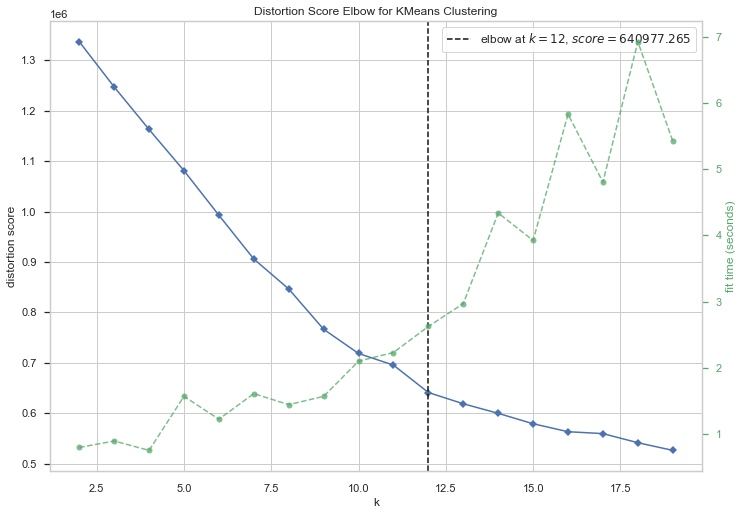

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [53]:
# Elbow Method for K means
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), timings= True)
visualizer.fit(X_norm)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

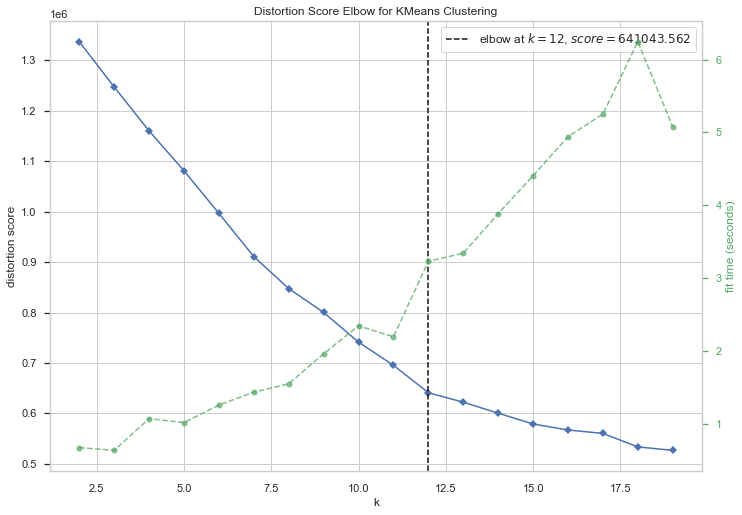

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [54]:
# Elbow Method for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(init='k-means++')
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), timings= True)
visualizer.fit(X_norm)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

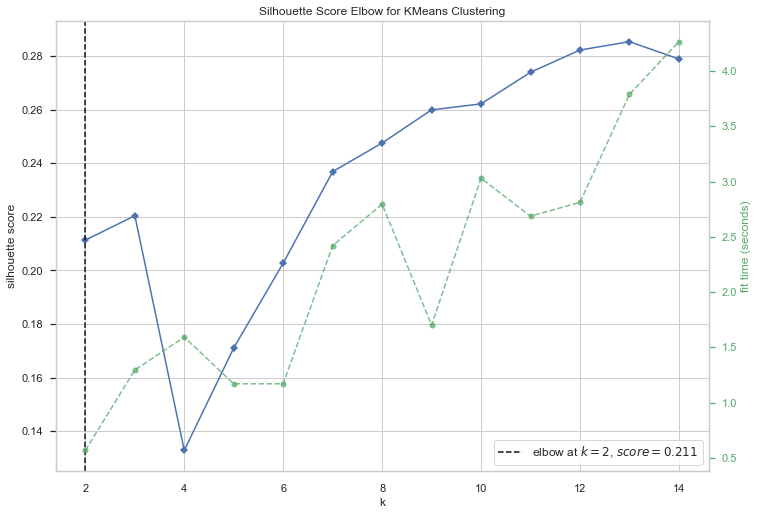

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [55]:
# Silhouette Score for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette', timings= True)
visualizer.fit(X_norm)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

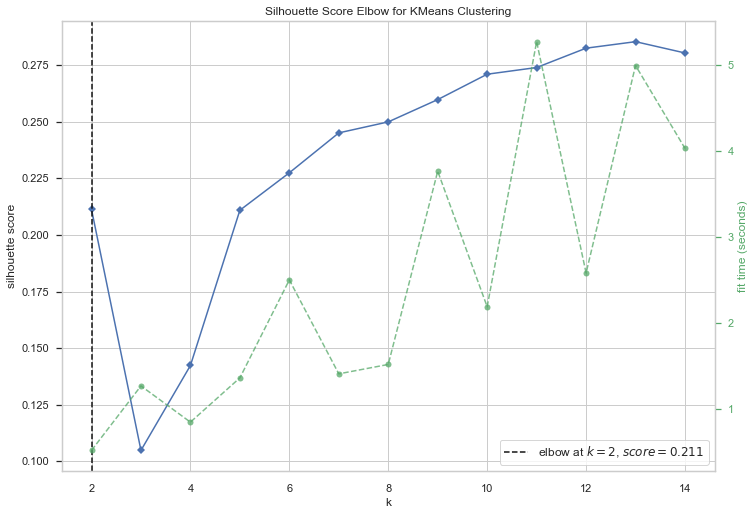

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [56]:
# Silhouette Score for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(init='k-means++')

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette', timings= True)
visualizer.fit(X_norm)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

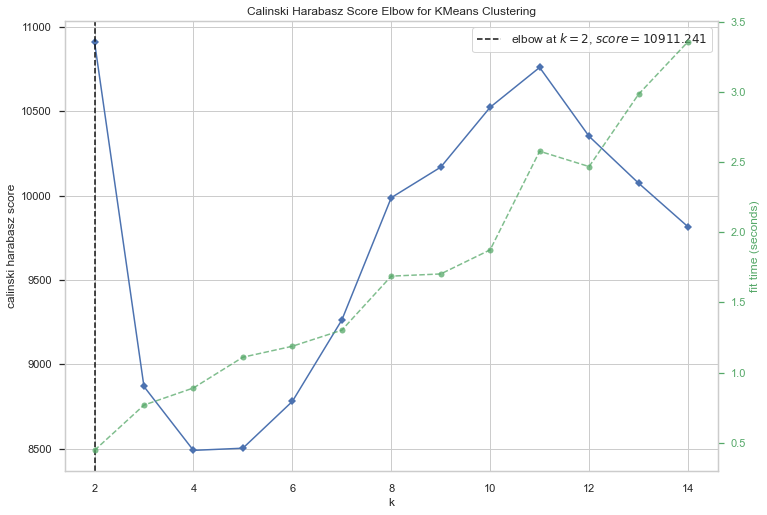

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [57]:
# Calinski Harabasz Score for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(init='k-means++')
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,15),metric='calinski_harabasz', timings= True)
visualizer.fit(X_norm)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

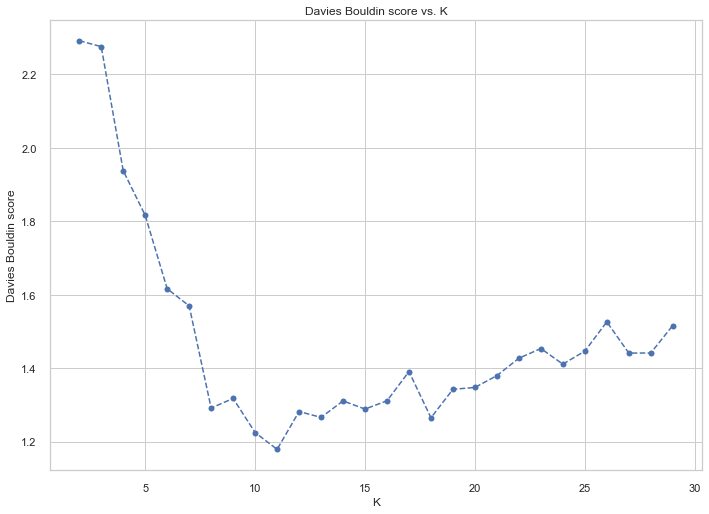

In [58]:
# Davies Bouldin score for K means
from sklearn.metrics import davies_bouldin_score
def get_kmeans_score(data, center):
    '''
    returns the kmeans score regarding Davies Bouldin for points to centers
    INPUT:
        data - the dataset you want to fit kmeans to
        center - the number of centers you want (the k value)
    OUTPUT:
        score - the Davies Bouldin score for the kmeans model fit to the data
    '''
    #instantiate kmeans
    kmeans = KMeans(n_clusters=center, init='k-means++')
# Then fit the model to your data using the fit method
    model = kmeans.fit_predict(X_norm)
    
    # Calculate Davies Bouldin score
    score = davies_bouldin_score(X_norm, model)
    
    return score
scores = []
centers = list(range(2,30))
for center in centers:
    scores.append(get_kmeans_score(X_norm, center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

In [24]:
# According to the curves above I chose to run the analysis with 12 clusters

[0.12564076 0.23547989]


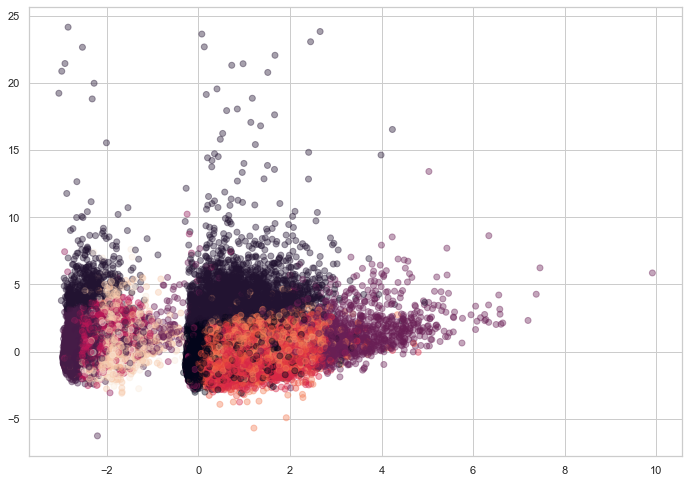

In [20]:
# To see what the clusters look like we will use a PCA to project the data on 2 dimensions
pca = decomposition.PCA(n_components=2)
pca.fit(X_norm)
print(pca.explained_variance_ratio_.cumsum())
X_trans = pca.transform(X_norm)

# I will display the data in these two components and colored according to the cluster for which they belong

# Figure parameters
sns.set()
plt.style.use('seaborn-whitegrid')
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')

# KMeans with 12 clusters
cls = KMeans(n_clusters=12)# KMeans for 8 clusters
cls.fit(X_norm)
plt.scatter(X_trans[:, 0], X_trans[:, 1], c=cls.labels_, alpha=0.4)
# We can note that the segregation works well. We can see well defined groups

In [21]:
# Add the different clusters to the data
columns_  = mydata2.columns

data_results = pd.DataFrame(X_norm, columns=columns_)
data_results['group'] = cls.labels_+1

data_results

,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances,group
0,0.0,1.980877,-0.043070,0.646352,-0.325377,-0.597221,-0.701873,0.834552,-0.149468,-0.828691,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,1.850877,-0.521462,-0.620818,9
1,0.0,-0.695181,-0.603410,-0.160359,-0.431244,-0.909192,-0.701873,0.814879,-0.149468,-0.976681,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,7
2,0.0,1.980877,-0.315058,-0.967070,1.224614,1.274603,-0.898377,-1.952520,-0.149468,-0.148390,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818,8
3,0.0,0.451701,-0.523152,-0.160359,-0.607245,0.754652,-0.014108,-0.536032,-0.149468,3.140114,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
4,0.0,1.216289,0.225547,0.646352,-0.629422,0.026720,-0.407116,-0.319624,-0.149468,-0.755131,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83947,0.0,-0.312887,0.081103,0.646352,-0.621872,0.650662,0.182397,-0.037637,-0.149468,2.950841,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818,8
83948,0.0,-0.695181,-0.323069,-0.160359,0.723850,1.794554,-0.898377,-0.149120,-0.149468,1.542879,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,7
83949,0.0,-0.695181,-0.186879,0.646352,-0.509872,0.234701,1.852683,-2.162370,-0.149468,1.541071,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
83950,0.0,0.833995,-0.083174,0.646352,-0.459898,-0.077270,0.280649,0.782090,-0.149468,0.054042,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,7


<AxesSubplot:xlabel='pca-one', ylabel='pca-two'>

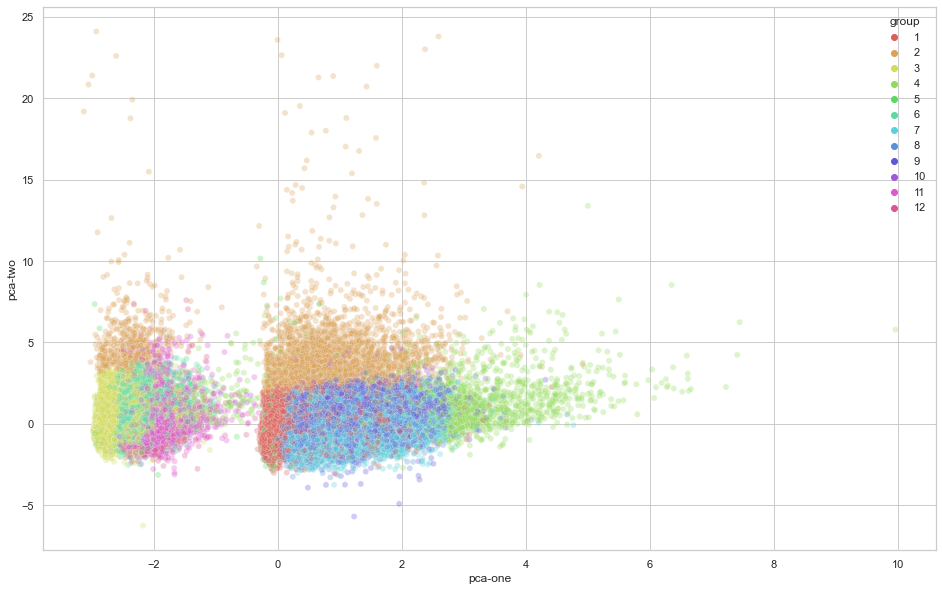

In [22]:
# M-Means Results visualization PCA
###################################

pca = decomposition.PCA(n_components=3)
pca_result = pca.fit_transform(data_results.iloc[:,:-1].values)
data_results['pca-one'] = pca_result[:,0]
data_results['pca-two'] = pca_result[:,1] 
data_results['pca-three'] = pca_result[:,2]

# project the data on 2 dimensions where color=clusters
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="group",
    palette=sns.color_palette("hls", 12),
    data=data_results,
    legend="full",
    alpha=0.3
)

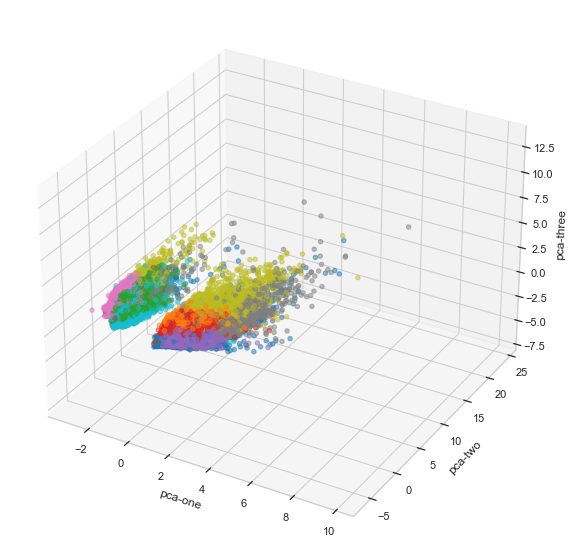

In [29]:
# project the data on 3 dimensions where color=clusters

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=data_results["pca-one"], 
    ys=data_results["pca-two"], 
    zs=data_results["pca-three"], 
    c=data_results["group"], 
    cmap='tab10',
    alpha=0.5
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

In [25]:
# T-Distributed Stochastic Neighbouring Entities (t-SNE)
# t-SNE minimizes the divergence between two distributions: 
# a distribution that measures pairwise similarities of the input objects 
# and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_results.iloc[:,:-4])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 83952 samples in 8.139s...
[t-SNE] Computed neighbors for 83952 samples in 368.723s...
[t-SNE] Computed conditional probabilities for sample 1000 / 83952
[t-SNE] Computed conditional probabilities for sample 2000 / 83952
[t-SNE] Computed conditional probabilities for sample 3000 / 83952
[t-SNE] Computed conditional probabilities for sample 4000 / 83952
[t-SNE] Computed conditional probabilities for sample 5000 / 83952
[t-SNE] Computed conditional probabilities for sample 6000 / 83952
[t-SNE] Computed conditional probabilities for sample 7000 / 83952
[t-SNE] Computed conditional probabilities for sample 8000 / 83952
[t-SNE] Computed conditional probabilities for sample 9000 / 83952
[t-SNE] Computed conditional probabilities for sample 10000 / 83952
[t-SNE] Computed conditional probabilities for sample 11000 / 83952
[t-SNE] Computed conditional probabilities for sample 12000 / 83952
[t-SNE] Computed conditional probabilities for 

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

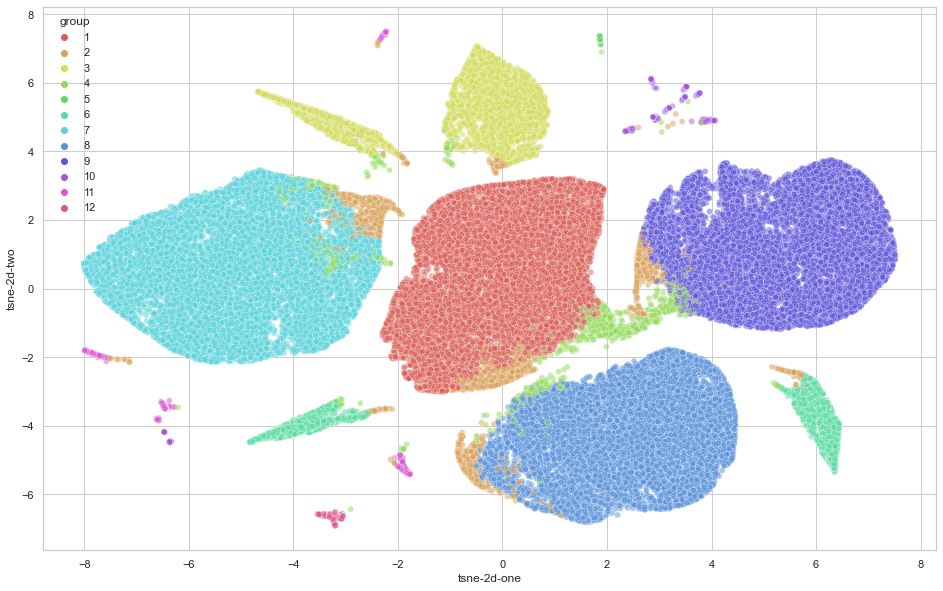

In [26]:
# Plot t-NSE
data_tnse = data_results.iloc[:,:-3]

data_tnse['tsne-2d-one'] = tsne_results[:,0]
data_tnse['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="group",
    palette=sns.color_palette("hls", 12),
    data=data_tnse,
    legend="full",
    alpha=0.5
)

In [27]:
# Group the clusters by the means of each feature
results = data_results.groupby('group').mean().iloc[:,:-3]
results = results.rename_axis('index').reset_index().rename(columns = {'index': 'Clusters'})
results.drop(['number_of_items'], axis=1, inplace=True)
results

,Clusters,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances
0,1,-0.026598,-0.192457,0.091188,-0.209514,-0.191607,0.126162,0.077865,-0.149468,-0.025525,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778
1,2,0.179136,0.046903,-2.172441,0.022546,2.869669,-2.486481,0.043990,-0.142357,0.597165,-0.128322,0.227128,-0.125854,-0.166991,0.045608,-0.105352,0.013315,-0.007610,-0.025605
2,3,-0.695181,-0.178953,0.072624,-0.254658,-0.044559,0.041015,-0.030923,-0.149468,0.042699,2.003835,-1.719272,-0.125854,-0.198224,0.390737,-0.107891,-0.540284,-0.521462,0.619628
3,4,1.629045,4.313333,-0.058190,3.065069,0.127555,0.082641,-0.110877,-0.132838,0.281554,-0.286398,0.364299,-0.113076,-0.156723,-0.024601,-0.097995,-0.152903,-0.013039,0.202340
4,5,-0.299390,-0.132378,0.116503,-0.253894,-0.241138,-0.106476,0.382664,-0.002203,-0.204322,0.075345,-0.084978,0.100452,-0.029446,-0.609027,9.268594,-0.540284,-0.521462,-0.620818
5,6,-0.695181,-0.138643,0.077730,0.142134,0.018750,0.015264,-0.104869,-0.149468,-0.051616,2.003835,-1.719272,-0.125854,-0.198224,-0.609027,-0.107891,0.693140,0.659508,-0.620818
6,7,0.302454,0.014477,0.162211,-0.265652,-0.210053,0.173133,0.092876,-0.149468,0.011978,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818
7,8,0.098195,-0.071587,0.173857,0.037856,-0.213313,0.165579,-0.109270,-0.149468,-0.051250,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818
8,9,0.353244,-0.103820,0.058643,0.220437,-0.093382,0.131641,-0.033750,-0.149468,-0.117276,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,1.850877,-0.521462,-0.620818
9,10,0.150568,-0.102022,0.053529,-0.039880,-0.016974,0.074280,-0.173481,5.651347,-0.060832,0.084034,0.035606,-0.125854,-0.175418,0.229791,-0.107891,0.198214,-0.118278,-0.278906


In [28]:
# Rename the feature for a better representation of the results
results = results.rename(columns = {'payment_installments': 'Installments',
                                    'payment_value': 'Price',
                                    'review_score': 'Review',
                                    'product_volume_m3': 'Volume(m3)',
                                    'days_purchase_to_delivery': 'Days to delivery',
                                    'lag_real_estimated_delivery': 'Lag delivery', 
                                    'client_novelty_scale': 'New customer', 
                                    'order_frequency': 'Frequency', 
                                    'distance_from_seller': 'Seller distance',
                                    'payment_type_boleto': 'Boleto',
                                    'payment_type_credit_card': 'Credit card',
                                    'payment_type_debit_card': 'Debit card',
                                    'payment_type_voucher': 'Voucher',
                                    'product_category_beauty_fashion': 'Beauty and Fashion',
                                    'product_category_food_product': 'Food',
                                    'product_category_house_and_decoration': 'House and Decoration',
                                    'product_category_other': 'Other Product',
                                    'product_category_technology_appliances': 'Technology and Appliances'}, inplace = False)

In [30]:
import plotly.graph_objects as go

categories = results.iloc[:,1:].columns

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==1].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='First'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==2].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Second'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==3].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Third'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==4].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fourth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==5].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fifth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==6].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Sixth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==7].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Seventh'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==8].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eighth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==9].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Ninth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==10].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Tenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==11].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eleventh'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==12].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Twelveth'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=False
    )),
  showlegend=True,
  autosize=True,
    width=900,
    height=900
)


# DBScan

In [33]:
from sklearn.datasets.samples_generator import make_blobs
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import sklearn.utils

In [35]:
# For DBSCAN I will use all the pre-selected features
# To run the anlysis I will use mydata2

In [36]:
# Transform the data into array numpy
X = mydata2.values
print(X.shape)

# Standardize the data so that they all have the same importance
from sklearn import preprocessing
X_norm = preprocessing.scale(X)
print(X_norm.shape)

(83952, 19)
(83952, 19)


In [45]:
# We can calculate the distance from each point to its closest neighbour using the NearestNeighbors. 
# The point itself is included in n_neighbors. The kneighbors method returns two arrays, The first contains 
# the distance to the closest n_neighbors points and the other contains the index for each of those points.

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_norm)
distances, indices = nbrs.kneighbors(X_norm)

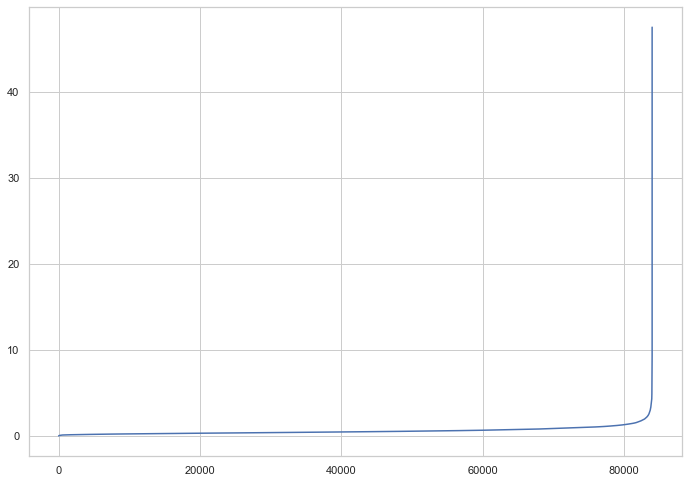

In [46]:
distances_sorted = np.sort(distances, axis=0)[:,1] #sort distances then exclude the indexes [:,1]

plt.plot(distances_sorted)
            # The optimal value for epsilon will be found at the point of maximum curvature.

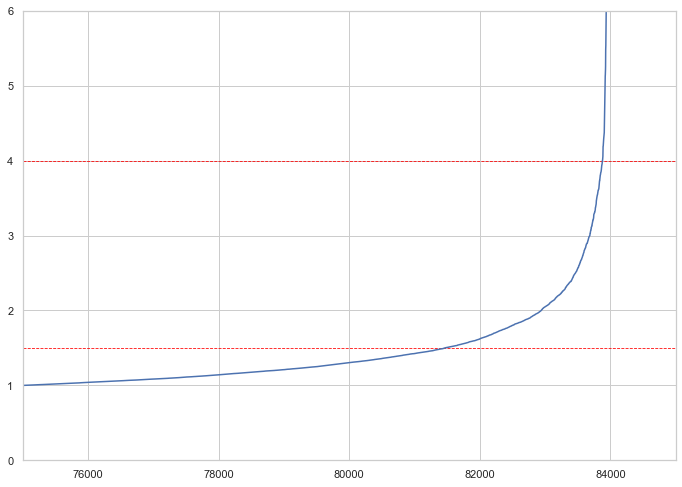

In [47]:
# Enlarge the Graph to detect the the point of maximum curvature.
distances_sorted = np.sort(distances, axis=0)[:,1] #sort distances then exclude the indexes [:,1]

plt.axhline(y=1.5, color='red', linestyle='--', linewidth=0.8)
plt.axhline(y=4, color='red', linestyle='--', linewidth=0.8)
plt.ylim(0, 6)
plt.xlim(75000, 85000)
plt.plot(distances_sorted)

In [137]:
# The results show that “epsilon(eps) value” will lie somewhere within 1.5 to 4.
# By using various possible eps values between 1.5 to 4 I can find silhouette score for each eps value
# and try to select the best eps value with highest silhouette score.

In [138]:
from sklearn import cluster, metrics

range_eps = np.arange(1.5, 4.5, 0.5)
for i in range_eps:
    print('eps value is', i, ':')
    db = DBSCAN(eps=i, min_samples=10).fit(X_norm)
    core_sample_mask = np.zeros_like(db.labels_, dtype=bool)
    core_sample_mask[db.core_sample_indices_] = True
    labels = db.labels_
    print(set(labels))
    silouhette_avg = metrics.silhouette_score(X_norm, labels)
    print('The average silouhette_score is:', silouhette_avg)

eps value is 1.5 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, -1}
The average silouhette_score is: 0.2742508984410292
eps value is 2.0 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, -1}
The average silouhette_score is: 0.2898199904651428
eps value is 2.5 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, -1}
The average silouhette_score is: 0.29133823149570925
eps value is 3.0 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, -1}
The average silouhette_score is: 0.29350592435116757
eps value is 3.5 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1}
The average silouhette_score is: 0.3142604321177434


In [143]:
# The results show that “epsilon(eps) value” will lie somewhere around 3.5
# I ran the same test by varying eps between 3 and 4 with a setp of 0.1

range_eps = [3, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4]
for i in range_eps:
    print('eps value is', i, ':')
    db = DBSCAN(eps=i, min_samples=10).fit(X_norm)
    core_sample_mask = np.zeros_like(db.labels_, dtype=bool)
    core_sample_mask[db.core_sample_indices_] = True
    labels = db.labels_
    print(set(labels))
    silouhette_avg = metrics.silhouette_score(X_norm, labels)
    print('For esp =', i,'The average silouhette_score is:', silouhette_avg)
            # The results show that silouhette score is the highest for eps = 3.5

eps value is 3 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, -1}
The average silouhette_score is: 0.29350592435116757
eps value is 3.1 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, -1}
The average silouhette_score is: 0.2935106040608955
eps value is 3.2 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, -1}
The average silouhette_score is: 0.222322176959362
eps value is 3.3 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, -1}
The average silouhette_score is: 0.15212598356759877
eps value is 3.4 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1}
The average silouhette_score is: 0.28704135912607565
eps value is 3.5 :
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1}
The average silouhette_score is: 0.3142604321177434
eps value is 3.6 :
{

In [151]:
# Find the ‘min_samples’ hyper parameter through cluster formation method
# Once the value of eps has been determined. I will vary the values of the min_samples 
# in order to choose the right ‘min_samples’

min_samples = np.arange(10, 51, 10)
for i in min_samples:
    print('min_samples value is', i)
    db = DBSCAN(eps=3.5, min_samples=i).fit(X_norm)
    core_sample_mask = np.zeros_like(db.labels_, dtype=bool)
    core_sample_mask[db.core_sample_indices_] = True
    # Ignoring the label -1 as its for the outliers
    labels = set([label for label in db.labels_ if label>=0])
    print(set(labels))
    print('for min_samples value =', i, 'Total no.of clusters are', str(len(set(labels))))
    
# Based on the following results the right min_samples seems to be equal to 20
# With min_samples=20 we get 10 clusters, a result that converge with KMEANS

min_samples value is 10
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}
for min_samples value =  10 Total no.of clusters are 10
min_samples value is 20
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}
for min_samples value =  20 Total no.of clusters are 10
min_samples value is 30
{0, 1, 2, 3, 4, 5}
for min_samples value =  30 Total no.of clusters are 6
min_samples value is 40
{0, 1, 2, 3, 4, 5}
for min_samples value =  40 Total no.of clusters are 6
min_samples value is 50
{0, 1, 2, 3, 4}
for min_samples value =  50 Total no.of clusters are 5


In [68]:
# Compute DBSCAN
db = DBSCAN(eps=3.5, min_samples=20).fit(X_norm)
core_sample_mask = np.zeros_like(db.labels_, dtype=bool)
core_sample_mask[db.core_sample_indices_] = True
labels = db.labels_
print(set(labels))

n_clusters_ = len(set(labels))
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters :', n_clusters_)
print('Estimated number of noise points :', n_noise_)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1}
Estimated number of clusters : 11
Estimated number of noise points : 459


In [69]:
# Add the assigned clusters to X_norm
columns_ = mydata.columns
data_results = pd.DataFrame(X_norm, columns=columns_)
data_results['group'] = db.labels_+1

# Drop all the observations considered as outliers (here 0 because I aded +1 on the labels)
data_results = (data_results[data_results['group']!=0]).reset_index()
data_results.drop(['index'], axis=1, inplace=True)
data_results

,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances,group
0,0.0,1.980877,-0.043070,0.646352,-0.325377,-0.597221,-0.701873,0.834552,-0.149468,-0.828691,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,1.850877,-0.521462,-0.620818,1
1,0.0,-0.695181,-0.603410,-0.160359,-0.431244,-0.909192,-0.701873,0.814879,-0.149468,-0.976681,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,1
2,0.0,1.980877,-0.315058,-0.967070,1.224614,1.274603,-0.898377,-1.952520,-0.149468,-0.148390,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818,1
3,0.0,0.451701,-0.523152,-0.160359,-0.607245,0.754652,-0.014108,-0.536032,-0.149468,3.140114,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
4,0.0,1.216289,0.225547,0.646352,-0.629422,0.026720,-0.407116,-0.319624,-0.149468,-0.755131,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83488,0.0,-0.312887,0.081103,0.646352,-0.621872,0.650662,0.182397,-0.037637,-0.149468,2.950841,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818,1
83489,0.0,-0.695181,-0.323069,-0.160359,0.723850,1.794554,-0.898377,-0.149120,-0.149468,1.542879,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,1
83490,0.0,-0.695181,-0.186879,0.646352,-0.509872,0.234701,1.852683,-2.162370,-0.149468,1.541071,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
83491,0.0,0.833995,-0.083174,0.646352,-0.459898,-0.077270,0.280649,0.782090,-0.149468,0.054042,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,1


<AxesSubplot:xlabel='pca-one', ylabel='pca-two'>

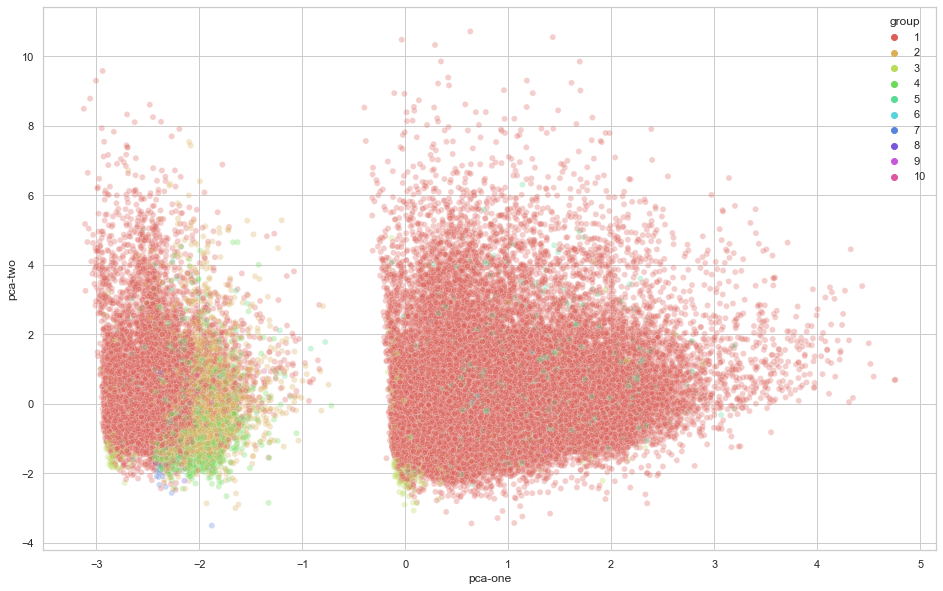

In [70]:
# Results visualization PCA
################################
from sklearn import decomposition

pca = decomposition.PCA(n_components=2)
pca_result = pca.fit_transform(data_results.iloc[:,:-1].values)
data_results['pca-one'] = pca_result[:,0]
data_results['pca-two'] = pca_result[:,1] 

# project the data on 2 dimensions where color=clusters
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="group",
    palette=sns.color_palette("hls", 10),
    data=data_results,
    legend="full",
    alpha=0.3
)

In [71]:
# T-Distributed Stochastic Neighbouring Entities (t-SNE)
# t-SNE minimizes the divergence between two distributions: 
# a distribution that measures pairwise similarities of the input objects 
# and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_results.iloc[:,:-3])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 83493 samples in 1.142s...
[t-SNE] Computed neighbors for 83493 samples in 352.067s...
[t-SNE] Computed conditional probabilities for sample 1000 / 83493
[t-SNE] Computed conditional probabilities for sample 2000 / 83493
[t-SNE] Computed conditional probabilities for sample 3000 / 83493
[t-SNE] Computed conditional probabilities for sample 4000 / 83493
[t-SNE] Computed conditional probabilities for sample 5000 / 83493
[t-SNE] Computed conditional probabilities for sample 6000 / 83493
[t-SNE] Computed conditional probabilities for sample 7000 / 83493
[t-SNE] Computed conditional probabilities for sample 8000 / 83493
[t-SNE] Computed conditional probabilities for sample 9000 / 83493
[t-SNE] Computed conditional probabilities for sample 10000 / 83493
[t-SNE] Computed conditional probabilities for sample 11000 / 83493
[t-SNE] Computed conditional probabilities for sample 12000 / 83493
[t-SNE] Computed conditional probabilities for 

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

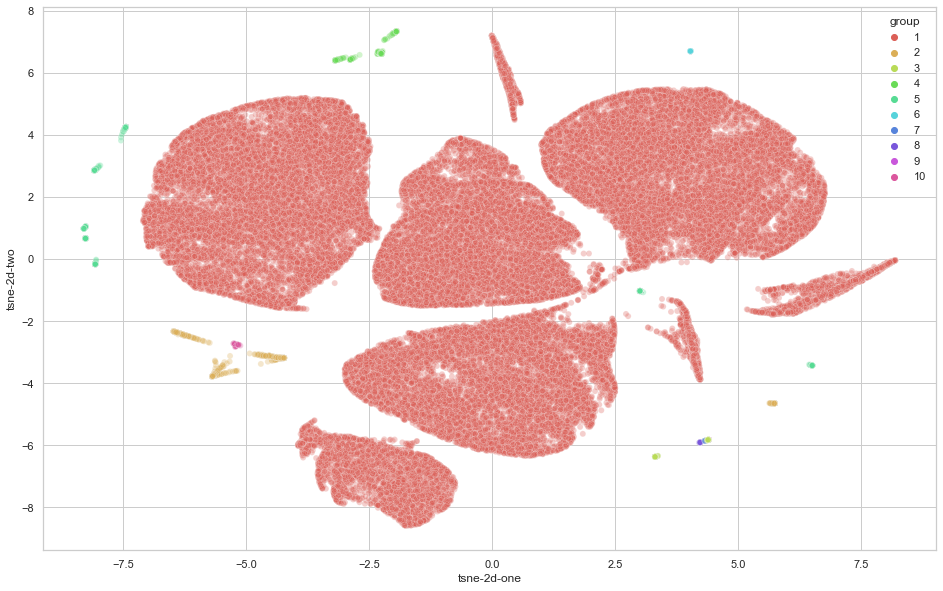

In [73]:
# plot t-SNE
data_tnse = data_results.iloc[:,:-2]

data_tnse['tsne-2d-one'] = tsne_results[:,0]
data_tnse['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="group",
    palette=sns.color_palette("hls", 10),
    data=data_tnse,
    legend="full",
    alpha=0.3
)

In [75]:
# Group the clusters by calculating the mean of each columns
results = data_results.iloc[:,:-2].groupby('group').mean()
results = results.rename_axis('index').reset_index().rename(columns = {'index': 'Clusters'})
results.drop(['number_of_items'], axis=1, inplace=True)
results

,Clusters,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances
0,1,0.035632,-0.014532,0.000750,-0.005486,-0.007840,0.009196,-0.000596,-0.149468,0.003374,0.025014,0.099872,-0.125854,-0.198224,0.002117,-0.107891,0.000512,0.011559,0.012526
1,2,-0.695181,-0.158516,-0.023660,-0.049673,-0.032756,0.063051,-0.127899,-0.149468,0.009587,-0.499043,-1.719272,-0.125854,5.044790,-0.001089,-0.107891,0.047514,-0.026598,0.006750
2,3,-0.304432,-0.209031,0.136406,-0.292079,-0.290577,-0.066036,0.398568,-0.149468,-0.213343,0.127405,0.005744,-0.125854,-0.198224,-0.609027,9.268594,-0.540284,-0.521462,-0.620818
3,4,-0.695181,-0.164137,0.047637,-0.166454,-0.191284,0.015092,0.437575,-0.149468,-0.108353,-0.499043,-1.719272,7.945719,-0.198224,-0.041307,-0.107891,-0.058211,-0.059102,0.175028
4,5,0.157836,-0.101799,0.033412,-0.039550,-0.006195,0.054997,-0.162162,5.102999,-0.064771,0.083174,0.046406,-0.125854,-0.198224,0.240537,-0.107891,0.203438,-0.121101,-0.291853
5,6,0.293089,-0.165028,0.242997,-0.078296,-0.152128,0.284830,-0.237070,10.355466,-0.041334,-0.392538,0.483730,-0.125854,-0.198224,0.061481,-0.107891,0.121101,-0.080340,-0.074789
6,7,-0.695181,-0.308912,0.259131,-0.277815,-0.755287,-0.285284,1.172411,-0.149468,-0.567793,-0.499043,-1.719272,7.945719,-0.198224,-0.609027,9.268594,-0.540284,-0.521462,-0.620818
7,8,-0.695181,-0.108134,0.368176,-0.286397,-0.353382,0.321305,0.065026,-0.149468,0.201293,-0.499043,-1.719272,-0.125854,5.044790,-0.609027,9.268594,-0.540284,-0.521462,-0.620818
8,9,0.060304,-0.309549,0.281412,-0.249661,-0.478375,0.161343,-0.239837,5.102999,-0.442174,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,9.268594,-0.540284,-0.521462,-0.620818
9,10,-0.695181,-0.394723,-0.020061,-0.194599,-0.017363,0.048902,-0.318269,5.102999,-0.085893,-0.499043,-1.719272,-0.125854,5.044790,0.369665,-0.107891,0.135479,-0.309363,-0.184202


In [76]:
# Rename the feature for a better representation of the results
results = results.rename(columns = {'payment_installments': 'Installments',
                                    'payment_value': 'Price',
                                    'review_score': 'Review',
                                    'product_volume_m3': 'Volume(m3)',
                                    'days_purchase_to_delivery': 'Days to delivery',
                                    'lag_real_estimated_delivery': 'Lag delivery', 
                                    'client_novelty_scale': 'New customer', 
                                    'order_frequency': 'Frequency', 
                                    'distance_from_seller': 'Seller distance',
                                    'payment_type_boleto': 'Boleto',
                                    'payment_type_credit_card': 'Credit card',
                                    'payment_type_debit_card': 'Debit card',
                                    'payment_type_voucher': 'Voucher',
                                    'product_category_beauty_fashion': 'Beauty and Fashion',
                                    'product_category_food_product': 'Food',
                                    'product_category_house_and_decoration': 'House and Decoration',
                                    'product_category_other': 'Other Product',
                                    'product_category_technology_appliances': 'Technology/Appliances'}, inplace = False)

In [77]:
import plotly.graph_objects as go

categories = results.iloc[:,1:].columns

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==1].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='First'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==2].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Second'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==3].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Third'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==4].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fourth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==5].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fifth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==6].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Sixth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==7].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Seventh'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==8].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eighth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==9].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Nineth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==10].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Tenth'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=False
    )),
  showlegend=True,
  autosize=True,
    width=850,
    height=850
)

In [78]:
# Compute DBSCAN
db = DBSCAN(eps=3.3, min_samples=20).fit(X_norm)
core_sample_mask = np.zeros_like(db.labels_, dtype=bool)
core_sample_mask[db.core_sample_indices_] = True
labels = db.labels_
print(set(labels))

n_clusters_ = len(set(labels))
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters :', n_clusters_)
print('Estimated number of noise points :', n_noise_)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, -1}
Estimated number of clusters : 20
Estimated number of noise points : 589


In [82]:
# Add the assigned clusters to X_norm
columns_ = mydata.columns
data_results = pd.DataFrame(X_norm, columns=columns_)
data_results['group'] = db.labels_+1

# Drop all the observations considered as outliers (here 0 because I aded +1 on the labels)
data_results = (data_results[data_results['group']!=0]).reset_index()
data_results.drop(['index'], axis=1, inplace=True)
data_results

,number_of_items,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances,group
0,0.0,1.980877,-0.043070,0.646352,-0.325377,-0.597221,-0.701873,0.834552,-0.149468,-0.828691,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,1.850877,-0.521462,-0.620818,1
1,0.0,-0.695181,-0.603410,-0.160359,-0.431244,-0.909192,-0.701873,0.814879,-0.149468,-0.976681,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,1
2,0.0,1.980877,-0.315058,-0.967070,1.224614,1.274603,-0.898377,-1.952520,-0.149468,-0.148390,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818,2
3,0.0,0.451701,-0.523152,-0.160359,-0.607245,0.754652,-0.014108,-0.536032,-0.149468,3.140114,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
4,0.0,1.216289,0.225547,0.646352,-0.629422,0.026720,-0.407116,-0.319624,-0.149468,-0.755131,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83358,0.0,-0.312887,0.081103,0.646352,-0.621872,0.650662,0.182397,-0.037637,-0.149468,2.950841,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818,2
83359,0.0,-0.695181,-0.323069,-0.160359,0.723850,1.794554,-0.898377,-0.149120,-0.149468,1.542879,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,1
83360,0.0,-0.695181,-0.186879,0.646352,-0.509872,0.234701,1.852683,-2.162370,-0.149468,1.541071,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,-0.521462,1.610778,1
83361,0.0,0.833995,-0.083174,0.646352,-0.459898,-0.077270,0.280649,0.782090,-0.149468,0.054042,-0.499043,0.581642,-0.125854,-0.198224,1.641964,-0.107891,-0.540284,-0.521462,-0.620818,1


<AxesSubplot:xlabel='pca-one', ylabel='pca-two'>

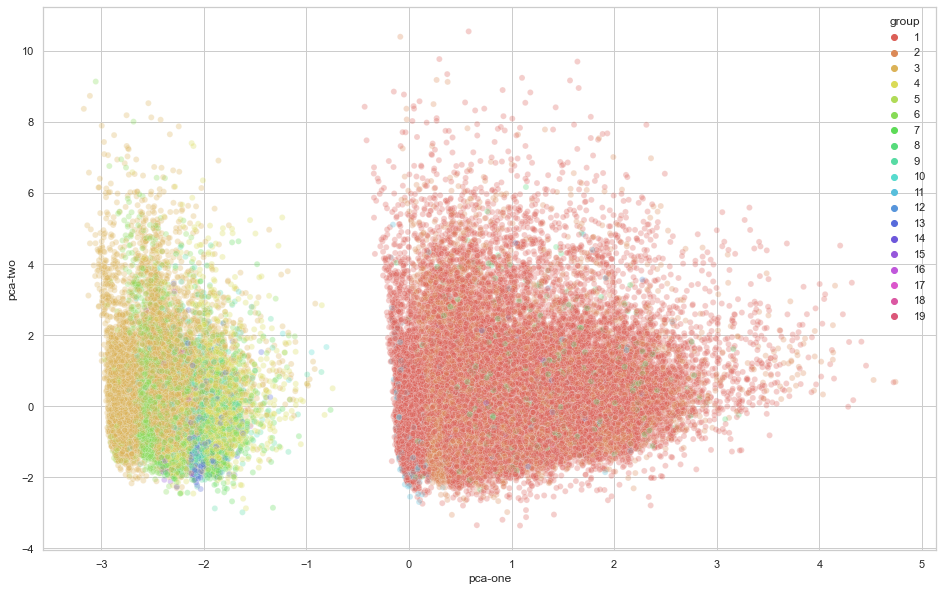

In [83]:
# Results visualization PCA
################################
from sklearn import decomposition

pca = decomposition.PCA(n_components=2)
pca_result = pca.fit_transform(data_results.iloc[:,:-1].values)
data_results['pca-one'] = pca_result[:,0]
data_results['pca-two'] = pca_result[:,1] 

# project the data on 2 dimensions where color=clusters
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="group",
    palette=sns.color_palette("hls", 19),
    data=data_results,
    legend="full",
    alpha=0.3
)

In [85]:
# T-Distributed Stochastic Neighbouring Entities (t-SNE)
# t-SNE minimizes the divergence between two distributions: 
# a distribution that measures pairwise similarities of the input objects 
# and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_results.iloc[:,:-3])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 83363 samples in 1.287s...
[t-SNE] Computed neighbors for 83363 samples in 361.061s...
[t-SNE] Computed conditional probabilities for sample 1000 / 83363
[t-SNE] Computed conditional probabilities for sample 2000 / 83363
[t-SNE] Computed conditional probabilities for sample 3000 / 83363
[t-SNE] Computed conditional probabilities for sample 4000 / 83363
[t-SNE] Computed conditional probabilities for sample 5000 / 83363
[t-SNE] Computed conditional probabilities for sample 6000 / 83363
[t-SNE] Computed conditional probabilities for sample 7000 / 83363
[t-SNE] Computed conditional probabilities for sample 8000 / 83363
[t-SNE] Computed conditional probabilities for sample 9000 / 83363
[t-SNE] Computed conditional probabilities for sample 10000 / 83363
[t-SNE] Computed conditional probabilities for sample 11000 / 83363
[t-SNE] Computed conditional probabilities for sample 12000 / 83363
[t-SNE] Computed conditional probabilities for 

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

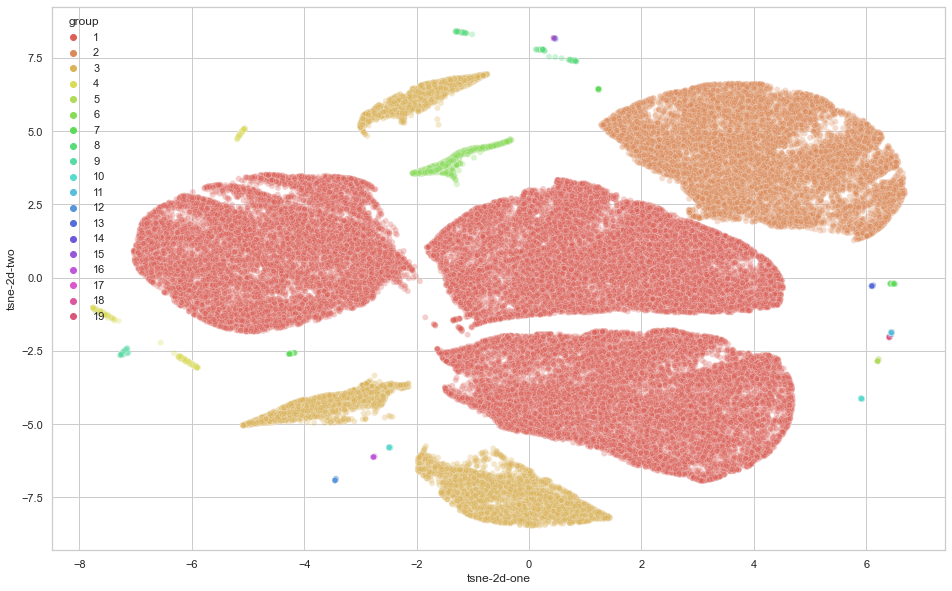

In [89]:
# plot t-SNE
data_tnse = data_results.iloc[:,:-2]

data_tnse['tsne-2d-one'] = tsne_results[:,0]
data_tnse['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="group",
    palette=sns.color_palette("hls", 19),
    data=data_tnse,
    legend="full",
    alpha=0.3
)

In [90]:
# Group the clusters by calculating the mean of each columns
results = data_results.iloc[:,:-2].groupby('group').mean()
results = results.rename_axis('index').reset_index().rename(columns = {'index': 'Clusters'})
results.drop(['number_of_items'], axis=1, inplace=True)
results

,Clusters,payment_installments,payment_value,review_score,product_volume_m3,days_purchase_to_delivery,lag_real_estimated_delivery,client_novelty_scale,order_frequency,distance_from_seller,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_beauty_fashion,product_category_food_product,product_category_house_and_decoration,product_category_other,product_category_technology_appliances
0,1,0.250144,0.012038,-0.012902,-0.026548,-0.023477,0.023872,0.050412,-0.149468,0.003732,-0.499043,0.581642,-0.125854,-0.198224,0.194621,-0.107891,0.149040,-0.521462,0.170729
1,2,0.148028,0.011681,0.057168,0.120681,-0.070679,0.042543,-0.107201,-0.149468,-0.020064,-0.499043,0.581642,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818
2,3,-0.695181,-0.140168,-0.020806,-0.080203,0.094798,-0.057313,-0.031811,-0.149468,0.030777,2.003835,-1.719272,-0.125854,-0.198224,0.093902,-0.107891,0.159628,-0.521462,0.260699
3,4,-0.695181,-0.162108,-0.042077,-0.071010,-0.020992,0.057194,-0.110443,-0.149468,0.003743,-0.499043,-1.719272,-0.125854,5.044790,0.154901,-0.107891,0.196367,-0.521462,0.165939
4,5,-0.695181,-0.252362,0.162326,-0.357118,-0.166750,-0.119672,0.351958,-0.149468,-0.184224,2.003835,-1.719272,-0.125854,-0.198224,-0.609027,9.268594,-0.540284,-0.521462,-0.620818
5,6,-0.695181,-0.107004,0.060509,0.013278,0.052095,-0.061054,-0.170840,-0.149468,-0.012952,2.003835,-1.719272,-0.125854,-0.198224,-0.609027,-0.107891,-0.540284,1.917684,-0.620818
6,7,-0.695181,-0.175256,0.043720,-0.174216,-0.186419,-0.015375,0.477119,-0.149468,-0.120768,-0.499043,-1.719272,7.945719,-0.198224,0.092175,-0.107891,0.055134,-0.521462,0.359933
7,8,0.391675,-0.104167,0.008090,-0.035073,-0.012128,0.057698,-0.146002,5.102999,-0.084426,-0.499043,0.581642,-0.125854,-0.198224,0.441191,-0.107891,0.327633,-0.521462,-0.240391
8,9,-0.695181,-0.155665,0.049464,0.033036,-0.095078,0.085414,-0.189177,-0.149468,0.018134,-0.499043,-1.719272,-0.125854,5.044790,-0.609027,-0.107891,-0.540284,1.917684,-0.620818
9,10,-0.568952,-0.094962,0.075566,-0.024903,0.040034,0.003503,-0.172311,5.102999,-0.065434,2.003835,-1.719272,-0.125854,-0.198224,0.301077,-0.107891,0.413602,-0.521462,-0.181717


In [91]:
# Rename the feature for a better representation of the results
results = results.rename(columns = {'payment_installments': 'Installments',
                                    'payment_value': 'Price',
                                    'review_score': 'Review',
                                    'product_volume_m3': 'Volume(m3)',
                                    'days_purchase_to_delivery': 'Days to delivery',
                                    'lag_real_estimated_delivery': 'Lag delivery', 
                                    'client_novelty_scale': 'New customer', 
                                    'order_frequency': 'Frequency', 
                                    'distance_from_seller': 'Seller distance',
                                    'payment_type_boleto': 'Boleto',
                                    'payment_type_credit_card': 'Credit card',
                                    'payment_type_debit_card': 'Debit card',
                                    'payment_type_voucher': 'Voucher',
                                    'product_category_beauty_fashion': 'Beauty and Fashion',
                                    'product_category_food_product': 'Food',
                                    'product_category_house_and_decoration': 'House and Decoration',
                                    'product_category_other': 'Other Product',
                                    'product_category_technology_appliances': 'Technology/Appliances'}, inplace = False)

In [93]:
import plotly.graph_objects as go

categories = results.iloc[:,1:].columns

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==1].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='First'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==2].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Second'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==3].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Third'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==4].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fourth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==5].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fifth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==6].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Sixth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==7].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Seventh'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==8].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eighth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==9].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Nineth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==10].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Tenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==11].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eleventh'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==12].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Twelfth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==13].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Thirteenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==14].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fourteenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==15].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Fifteenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==16].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Sixteenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==17].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Seventeenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==18].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Eighteenth'
))
fig.add_trace(go.Scatterpolar(
      r=results[results['Clusters']==19].iloc[:,1:].values[0],
      theta=categories,
      #fill='toself',
      name='Nineteenth'
))


fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=False
    )),
  showlegend=True,
  autosize=True,
    width=1000,
    height=1000
)


# Stability of the segments over time

In [19]:
# To do so, I am going to select the data for the first year, than perform a KMeans(K=12). 
# Then, I will do the same on the data of that same year + 1 Month(30 days) and then + 6 Months(180 days)
# Finaly I will estimate the ARI bteween the first year and the year+1M and between the first year and the year+6M.

In [26]:
mydata2 = mydata.iloc[:,:].drop(['number_of_items'], axis=1, inplace=False)
# Data first year
mydata_firstyear = mydata2[(mydata2['client_novelty_scale']>=0) & (mydata2['client_novelty_scale']<366)]
# Data first year + 1 month
mydata_firstyear_1M = mydata2[(mydata2['client_novelty_scale']>=0) & (mydata2['client_novelty_scale']<396)]
# Data first year + 6 months
mydata_firstyear_6M = mydata2[(mydata2['client_novelty_scale']>=0) & (mydata2['client_novelty_scale']<546)]

In [27]:
# Define a function kmeans_test(k=12)
from sklearn.cluster import KMeans
import sklearn.metrics as metrics

def kmeans_test(data=None, n_clusters=12):
    
    ### Attribution des labels ###
    
    kmeans_test = KMeans(n_clusters=n_clusters).fit(data)
    pred = kmeans_test.labels_
    return pred

In [28]:
# Compare ARI to Year + 1 month
results_firstyear = kmeans_test(data=mydata_firstyear)
results_firstyear_1M = kmeans_test(data=mydata_firstyear_1M)

mydata_firstyear['Cluster_firstyear'] = results_firstyear
mydata_firstyear_1M['Cluster_firstyear_1M'] = results_firstyear_1M

test = pd.merge(mydata_firstyear['Cluster_firstyear'], mydata_firstyear_1M['Cluster_firstyear_1M'], left_index=True, right_index=True)

metrics.adjusted_rand_score(test['Cluster_firstyear'], test['Cluster_firstyear_1M'] )
# ARI value tends toward 1 which means that after 1 month the segmentation is stable

<ipython-input-28-9e283c9a2daf>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mydata_firstyear['Cluster_firstyear'] = results_firstyear
<ipython-input-28-9e283c9a2daf>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mydata_firstyear_1M['Cluster_firstyear_1M'] = results_firstyear_1M


0.967673439320078

In [29]:
# Compare ARI to Year + 6 month
results_firstyear = kmeans_test(data=mydata_firstyear)
results_firstyear_6M = kmeans_test(data=mydata_firstyear_6M)

mydata_firstyear['Cluster_firstyear'] = results_firstyear
mydata_firstyear_6M['Cluster_firstyear_6M'] = results_firstyear_6M

test = pd.merge(mydata_firstyear['Cluster_firstyear'], mydata_firstyear_6M['Cluster_firstyear_6M'], left_index=True, right_index=True)

metrics.adjusted_rand_score(test['Cluster_firstyear'], test['Cluster_firstyear_6M'] )
# The ARI value has significantly decreased after 6 months which means that after 6 months the segmentation is less stable 

<ipython-input-29-71e94452e6de>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mydata_firstyear['Cluster_firstyear'] = results_firstyear
<ipython-input-29-71e94452e6de>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mydata_firstyear_6M['Cluster_firstyear_6M'] = results_firstyear_6M


0.5700906651708746

In [30]:
ARI_score = []
for M in [30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]:
    mydata_firstyear = mydata2[(mydata2['client_novelty_scale']>=0) & (mydata2['client_novelty_scale']<366)]
    mydata_to_compare = mydata2[(mydata2['client_novelty_scale']>=0) & (mydata2['client_novelty_scale']<366+M)]
    
    def kmeans_test(data=None, n_clusters=12):
    
        kmeans_test = KMeans(n_clusters=n_clusters).fit(data)
        pred = kmeans_test.labels_
        return pred
    
    results_firstyear = kmeans_test(data=mydata_firstyear)
    results_firstyear_M = kmeans_test(data=mydata_to_compare)

    mydata_firstyear['Cluster_firstyear'] = results_firstyear
    mydata_to_compare['Cluster_firstyear_M'] = results_firstyear_M

    test = pd.merge(mydata_firstyear['Cluster_firstyear'], mydata_to_compare['Cluster_firstyear_M'], 
                    left_index=True, right_index=True)

    ARI_score.append(metrics.adjusted_rand_score(test['Cluster_firstyear'], test['Cluster_firstyear_M']))

<ipython-input-30-0b426db61711>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mydata_firstyear['Cluster_firstyear'] = results_firstyear
<ipython-input-30-0b426db61711>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mydata_to_compare['Cluster_firstyear_M'] = results_firstyear_M
<ipython-input-30-0b426db61711>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

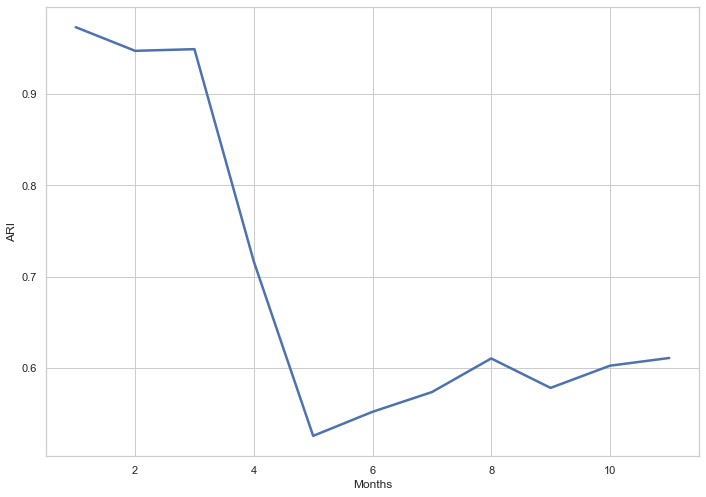

In [32]:
# Plot the results ARI as function of months
ax = sns.lineplot(x=[1,2,3,4,5,6,7,8,9,10,11], y=ARI_score, linewidth=2.5)

ax.set(xlabel='Months', ylabel='ARI')

plt.show()
# The results shows that after 3 to 4 months the ARI decreases significantly,
# so the segmentation should be done each 3 to 4 months